# TP Final Analisis de Datos Espaciales

## Clasificador campo / no campo

Al trabajar con datos del agro, es frecuente encontrarse con NAs en las variables `lat, lon`. Para resolver este inconveniente, se suele entrar a Google Maps, escribir la localidad y buscar algun campo a mano para sacar esta información. El problema claro es que este procedimiento **no es escalable** para un alto volumen de NAs, por lo tanto queremos investigar que soluciones alternativas existen.

Después de participar de las clases de ADE se nos ocurrió entrenar un clasificador binario campo / no campo que, dado un raster de imágenes satelitales, identifique satisfactoriamente las potenciales ubicaciones de donde sacar coordenadas. Esto podría solucionar nuestro problema, ahorrando muchisimo tiempo al proceso de analizar datos agro.

## Encontramos un paper

 [*"Automating field boundary delineation with multi-temporal Sentinel-2 imagery"*](https://www.researchgate.net/publication/337182705_Automating_field_boundary_delineation_with_multi-temporal_Sentinel-2_imagery)

 Usan técnicas de aprendizaje no supervisado que nos gustaría investigar (Canny Edge Detection, Watershed Segmentation) y comparar con un clasficiador supervisado por pixel. Los autores del paper sostienen que el análisis de imagen orientado a objetos (OBIA) supera limitaciones de las clasificaciones por pixel al **eliminar la necesidad de datos de entrenamiento y mejorar la precision espacial** al delinear limites de campo cerrados.

### Objetivo general

Nuestro objetivo general es diseñar y evaluar un método automático para detectar y delimitar áreas de campo agrícola a partir de imagenes multitemporales de Sentinel-2.

Queremos utilizar un método del paper que clasifica campos, no por píxel, sino por un conjunto de ellos que selecciona mediante el metodo canny y watershed segmentation.

* Canny ayuda a distiguir Bordes, zonas donde el valor cambia bruscamente → como el límite entre dos parcelas.

* Watershed crea regiones cerradas, posibles campos agrícolas.

Objetivos específicos

1. Construir una representación multi-temporal por píxel (características espectrales y fenológicas) a partir de series Sentinel-2.

2. Implementar un pipeline no supervisado de delineación de campos basado en detección de bordes (Canny) + Watershed (según paper) y extraer segmentos candidatos.

3. a) En este punto no sabemos si usar un modelo supervisado donde usamos datos secundarios para crear etiquetas automáticas débiles. Por ejemplo Zonas urbanas de OpenStreetMap → etiquetamos como “no campo”, extraer polígonos de áreas rurales por la pag oficial del gobierno IGN y/o eliminación automática de cuerpos de agua, infraestructura, ciudades.
  
     b) La otra opcion podria ser un modelo no supervisado, clustering. Donde se analiza cada cluster y se asigna etiqueta por interpretación visual o por porcentaje de presencia rural.



4. Evaluar la precisión de detección y la utilidad práctica para imputar coordenadas.

### Un poquito más detallado.

### Canny
* Suaviza la imagen (ruido ↓)

* Calcula gradiente de intensidad

* Detecta máximos de gradiente (posibles bordes)

* Aplica umbrales para quedarse con bordes significativos

* Conecta bordes en líneas limpias


### Watershed

Imagina la imagen como un mapa de alturas:

* Los valores bajos = valles (cuencas)

* Los valores altos = cimas

Luego:

* “Llenan de agua” los valles

* Cuando dos cuencas se encuentran → aparece una línea divisoria

* Esas líneas son segmentaciones (regiones)

una vez obtenida las regiones se extraen los segmentos candidatos que queremos (campo), para eso filtrariamos según criterios geompetricos o espectrales. (Área mínima:	Campos no suelen ser muy pequeños, por su forma	los lotes suelen tener formas regulares, por su NDVI medio alto: Vegetación presente y por su variabilidad temporal: Cultivos cambian a lo largo del tiempo.

## Rasters INTA

Descargamos RASTERS de la campaña agricola 23/24, hay un raster para invierno y otro para verano.


In [2]:
import numpy as np
import glob
import matplotlib.pyplot as plt
from skimage import feature, filters, segmentation, morphology
from scipy import ndimage as ndi
import os
import rasterio
import pandas as pd
r_rasters = r"..\data\raw\sentinel_23_24"
r_inta = r"..\data\raw\INTA_23_24"


In [3]:
# Mostrar solo características de los raster .tif en r_inta

inta_tif_files = glob.glob(os.path.join(r_inta, "*.tif"))

if len(inta_tif_files) == 0:
    print(f"No se encontraron archivos .tif en {r_inta}")
else:
    print(f"Se encontraron {len(inta_tif_files)} archivos .tif en {r_inta}\n")
    for idx, tif_path in enumerate(inta_tif_files, 1):
        with rasterio.open(tif_path) as src:
            print(f"Raster {idx}: {os.path.basename(tif_path)}")
            print(f"\tDimensiones (alto, ancho): {src.height} x {src.width}")
            print(f"\tN° bandas: {src.count}")
            print(f"\tTipo de dato: {src.dtypes[0]}")
            print(f"\tCRS: {src.crs}")
            print(f"\tPixel size (resolución): {src.res[0]} x {src.res[1]}")
            print(f"\tExtensión (bounds): {src.bounds}\n")


Se encontraron 2 archivos .tif en ..\data\raw\INTA_23_24

Raster 1: MNC_invierno2023.tif
	Dimensiones (alto, ancho): 70641 x 43994
	N° bandas: 1
	Tipo de dato: uint8
	CRS: EPSG:4326
	Pixel size (resolución): 0.0002694945852388963 x 0.0002694945852408658
	Extensión (bounds): BoundingBox(left=-67.476323746, bottom=-41.035940494, right=-55.620178963, top=-21.998573498)

Raster 2: MNC_verano-2024.tif
	Dimensiones (alto, ancho): 70641 x 43994
	N° bandas: 1
	Tipo de dato: uint8
	CRS: EPSG:4326
	Pixel size (resolución): 0.0002694945852388963 x 0.0002694945852408658
	Extensión (bounds): BoundingBox(left=-67.476323746, bottom=-41.035940494, right=-55.620178963, top=-21.998573498)



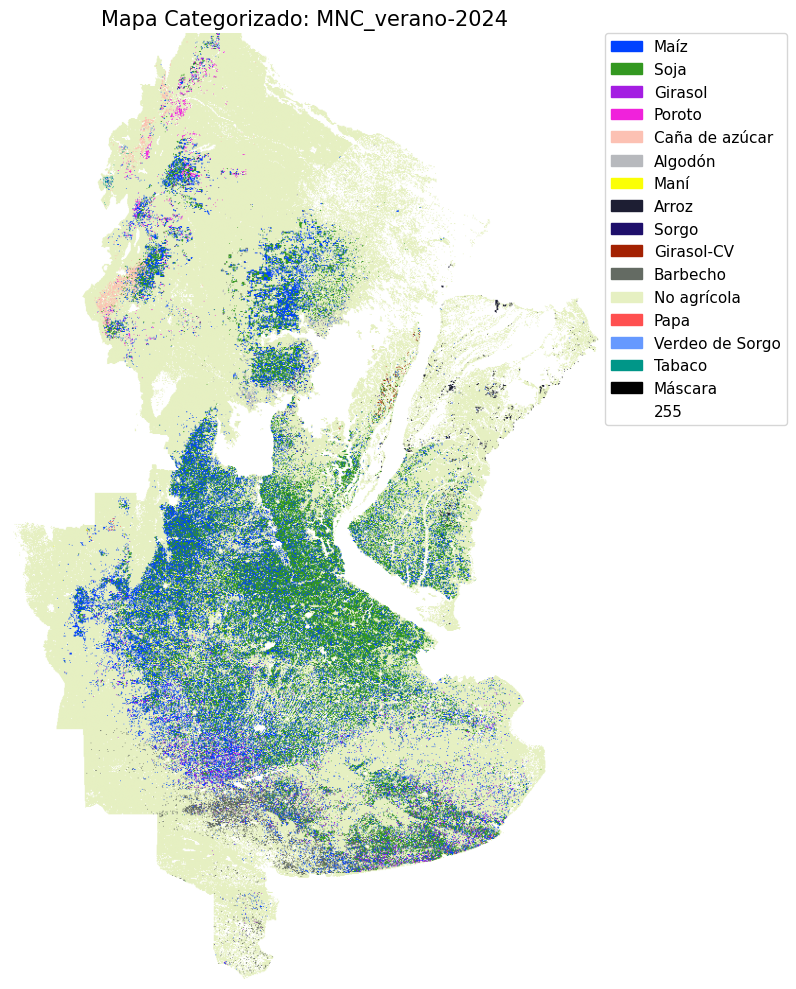

Imagen categorizada guardada en: img\MNC_verano-2024_categorizado.png


In [12]:

import xml.etree.ElementTree as ET
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.pyplot as plt
import rasterio
import rasterio.enums
import os

# Paths
tif_path = os.path.join(r_inta, "MNC_verano-2024.tif")
qml_path = os.path.join("..","data", "raw", "INTA_23_24", "MNC_ver24.qml")
out_dir = "img"
os.makedirs(out_dir, exist_ok=True)
png_out_path = os.path.join(out_dir, "MNC_verano-2024_categorizado.png")

# --- Parse QML for classes/colors ---
tree = ET.parse(qml_path)
root = tree.getroot()

# Encontrar el nodo <colorrampshader>
shader = root.find(".//colorrampshader")
items = shader.findall(".//item")

# Extraer valores, etiquetas y colores - permitiendo tanto "R,G,B,A" como "#RRGGBB"
labels = []
vals = []
hex_colors = []
for it in items:
    vals.append(int(float(it.get("value"))))
    labels.append(it.get("label"))
    qml_col = it.get("color")
    if qml_col.startswith("#"):  # hexadecimal color
        # Si es, por ejemplo, "#0042ff", simplemente lo usamos.
        hex_colors.append(qml_col.lower())
    else:
        # formateo "R,G,B,A"
        rgb_split = qml_col.split(",")
        if len(rgb_split) >= 3:
            try:
                rgb = tuple(map(int, rgb_split[:3]))
                hex_colors.append('#{:02x}{:02x}{:02x}'.format(*rgb))
            except Exception as e:
                # Fallback: gris, y advertimos
                hex_colors.append("#888888")
                print(f"[WARN] No se pudo interpretar color '{qml_col}': {e}")
        else:
            # Si no se puede interpretar, asignamos un color default
            hex_colors.append("#888888")
            print(f"[WARN] Color desconocido para item con label '{it.get('label')}': '{qml_col}'")

# Ordenar por valor
z = sorted(zip(vals, hex_colors, labels), key=lambda t: t[0])
vals, hex_colors, labels = [list(x) for x in zip(*z)]

# Para BoundaryNorm, los boundaries deben ser valores exactos de corte de clase
boundaries = vals + [vals[-1] + 1]  # boundary superior 1 por encima

cmap = ListedColormap(hex_colors)
norm = BoundaryNorm(boundaries, ncolors=len(hex_colors))

# --- Leer el raster y muestrear low-res ---
with rasterio.open(tif_path) as src:
    W_preview, H_preview = 1000, 1000
    img = src.read(
        1,
        out_shape=(H_preview, W_preview),
        resampling=rasterio.enums.Resampling.nearest
    )
    extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]

plt.figure(figsize=(10,10))
im = plt.imshow(img, cmap=cmap, norm=norm, extent=extent, origin='upper')
plt.title("Mapa Categorizado: MNC_verano-2024", fontsize=15)
plt.axis("off")
# Hacer una leyenda custom
import matplotlib.patches as mpatches
handles = [mpatches.Patch(color=hex_colors[i], label=labels[i]) for i in range(len(labels))]
plt.legend(handles=handles, bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0., fontsize=11)
plt.tight_layout()
plt.savefig(png_out_path, dpi=200, bbox_inches='tight')
plt.show()
print(f"Imagen categorizada guardada en: {png_out_path}")



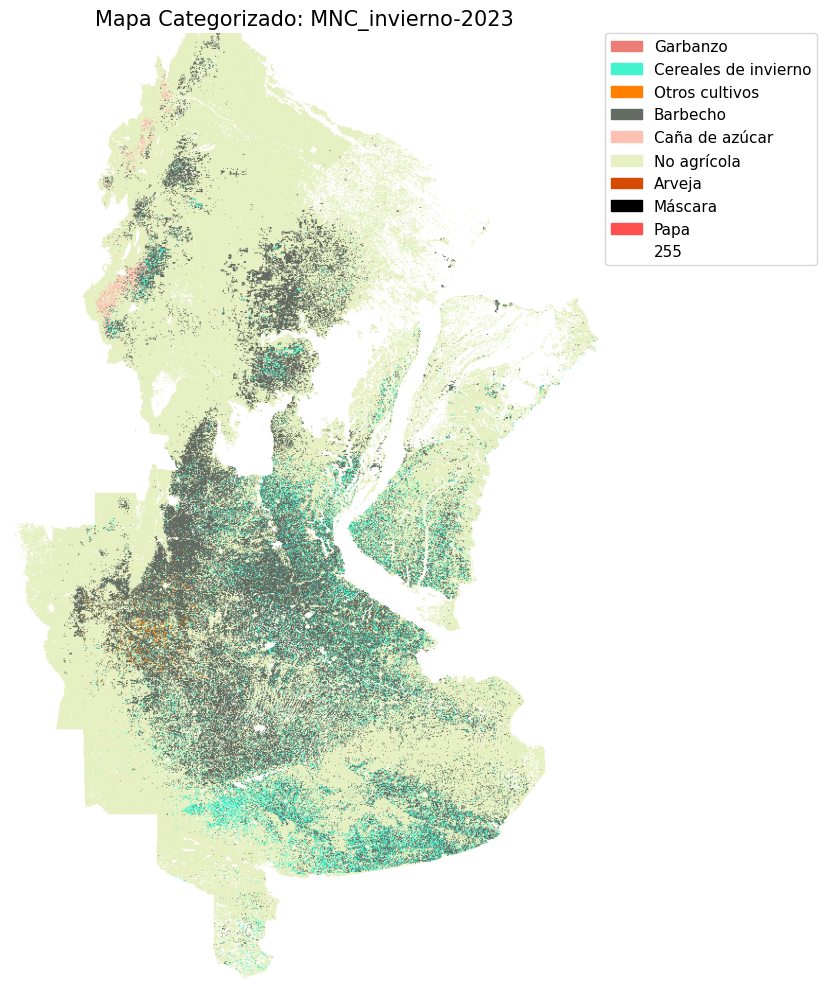

Imagen categorizada guardada en: img\MNC_invierno2023_categorizado.png


In [16]:

# --- Visualización categorizada: INVIERNO (MNC_inv23.qml & MNC_invierno2023.tif) ---

# Paths a archivos invierno (manteniendo consistencia con el bloque anterior)
tif_path_inv = os.path.join(r_inta, "MNC_invierno2023.tif")
qml_path_inv = os.path.join("..", "data", "raw", "INTA_23_24", "MNC_inv23.qml")
png_out_path_inv = os.path.join(out_dir, "MNC_invierno2023_categorizado.png")

# --- Parsear la leyenda del QML de invierno ---
from xml.etree import ElementTree as ET

tree_inv = ET.parse(qml_path_inv)
root_inv = tree_inv.getroot()

labels_inv = []
vals_inv = []
hex_colors_inv = []

for it in root_inv.iter('item'):
    label = it.get('label')
    value = it.get('value')
    color = it.get('color')
    if label and value:
        labels_inv.append(label)
        vals_inv.append(int(float(value)))
        qml_col = color
        if qml_col is None:
            hex_colors_inv.append("#888888")
            continue
        if qml_col.startswith("#"):
            hex_colors_inv.append(qml_col)
        elif "," in qml_col:
            rgb_split = qml_col.split(",")
            try:
                rgb = tuple(map(int, rgb_split[:3]))
                hex_colors_inv.append('#{:02x}{:02x}{:02x}'.format(*rgb))
            except Exception as e:
                hex_colors_inv.append("#888888")
                print(f"[WARN] No se pudo interpretar color '{qml_col}': {e}")
        else:
            hex_colors_inv.append("#888888")
            print(f"[WARN] Color desconocido para item con label '{it.get('label')}': '{qml_col}'")

# Ordenar por valor
z_inv = sorted(zip(vals_inv, hex_colors_inv, labels_inv), key=lambda t: t[0])
vals_inv, hex_colors_inv, labels_inv = [list(x) for x in zip(*z_inv)]

# Para BoundaryNorm, los boundaries deben ser valores exactos de corte de clase
boundaries_inv = vals_inv + [vals_inv[-1] + 1]  # boundary superior 1 por encima

cmap_inv = ListedColormap(hex_colors_inv)
norm_inv = BoundaryNorm(boundaries_inv, ncolors=len(hex_colors_inv))

# --- Leer el raster y muestrear low-res ---
with rasterio.open(tif_path_inv) as src_inv:
    W_preview, H_preview = 1000, 1000
    img_inv = src_inv.read(
        1,
        out_shape=(H_preview, W_preview),
        resampling=rasterio.enums.Resampling.nearest
    )
    extent_inv = [src_inv.bounds.left, src_inv.bounds.right, src_inv.bounds.bottom, src_inv.bounds.top]

plt.figure(figsize=(10,10))
im_inv = plt.imshow(img_inv, cmap=cmap_inv, norm=norm_inv, extent=extent_inv, origin='upper')
plt.title("Mapa Categorizado: MNC_invierno-2023", fontsize=15)
plt.axis("off")
import matplotlib.patches as mpatches
handles_inv = [mpatches.Patch(color=hex_colors_inv[i], label=labels_inv[i]) for i in range(len(labels_inv))]
plt.legend(handles=handles_inv, bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0., fontsize=11)
plt.tight_layout()
plt.savefig(png_out_path_inv, dpi=200, bbox_inches='tight')
plt.show()
print(f"Imagen categorizada guardada en: {png_out_path_inv}")



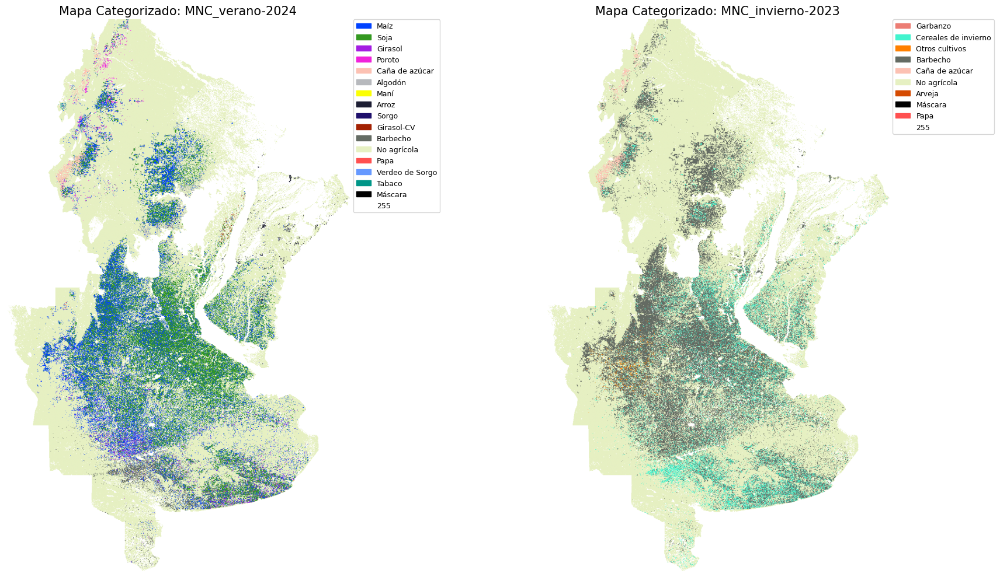

Imagen combinada guardada en: img\MNC_verano_invierno_combinado.png


In [18]:
# --- Visualización combinada: Verano e Invierno lado a lado ---

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Plot izquierdo: Verano
axes[0].imshow(img, cmap=cmap, norm=norm, extent=extent, origin='upper')
axes[0].set_title("Mapa Categorizado: MNC_verano-2024", fontsize=15)
axes[0].axis("off")
handles_ver = [mpatches.Patch(color=hex_colors[i], label=labels[i]) for i in range(len(labels))]
axes[0].legend(handles=handles_ver, bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0., fontsize=9)

# Plot derecho: Invierno
axes[1].imshow(img_inv, cmap=cmap_inv, norm=norm_inv, extent=extent_inv, origin='upper')
axes[1].set_title("Mapa Categorizado: MNC_invierno-2023", fontsize=15)
axes[1].axis("off")
handles_inv = [mpatches.Patch(color=hex_colors_inv[i], label=labels_inv[i]) for i in range(len(labels_inv))]
axes[1].legend(handles=handles_inv, bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0., fontsize=9)

plt.tight_layout()
png_out_path_combined = os.path.join(out_dir, "MNC_verano_invierno_combinado.png")
plt.savefig(png_out_path_combined, dpi=200, bbox_inches='tight')
plt.show()
print(f"Imagen combinada guardada en: {png_out_path_combined}")


## Visualizaciones para comparar NDVI a lo largo del tiempo


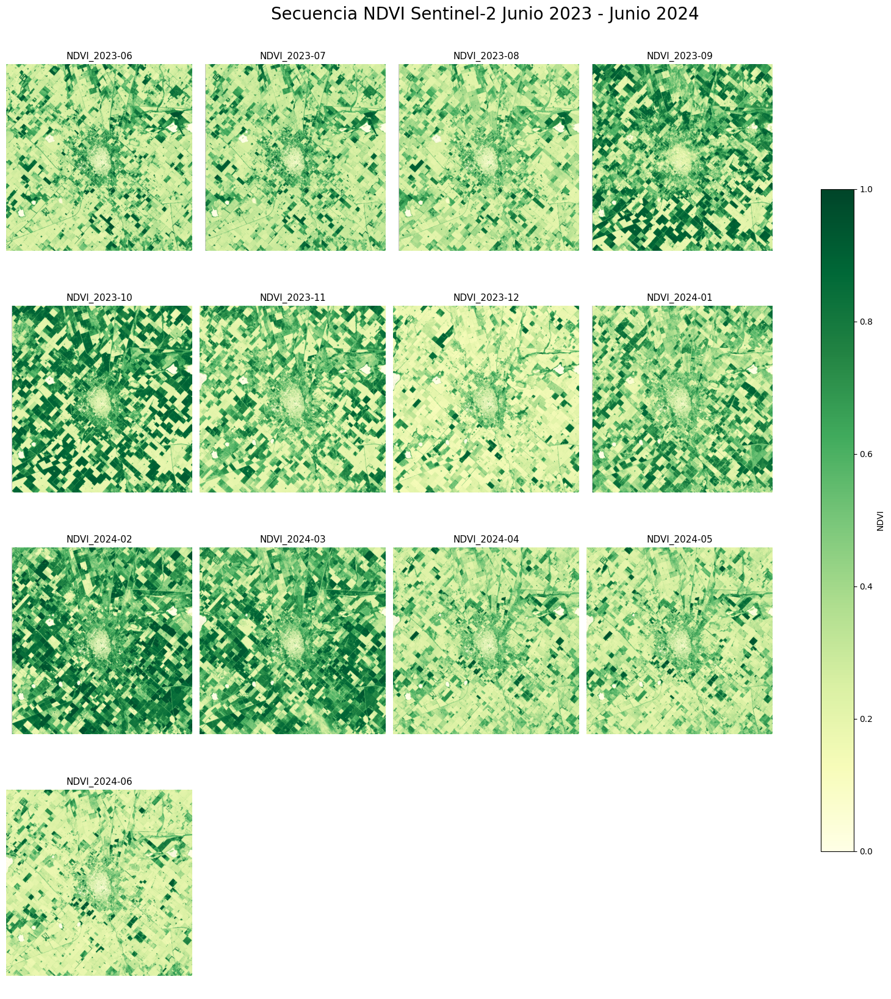

In [20]:
import os
import matplotlib.pyplot as plt
import rasterio

# Definir la ruta al directorio donde buscar archivos
data_dir = os.path.join("..", "data", "raw", "sentinel_23_24")

# Secuencia exacta de archivos .tif según la imagen
archivos = [
    "NDVI_2023-06.tif",
    "NDVI_2023-07.tif",
    "NDVI_2023-08.tif",
    "NDVI_2023-09.tif",
    "NDVI_2023-10.tif",
    "NDVI_2023-11.tif",
    "NDVI_2023-12.tif",
    "NDVI_2024-01.tif",
    "NDVI_2024-02.tif",
    "NDVI_2024-03.tif",
    "NDVI_2024-04.tif",
    "NDVI_2024-05.tif",
    "NDVI_2024-06.tif",
]

n = len(archivos)
ncols = 4
nrows = (n + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))

for idx, archivo in enumerate(archivos):
    fpath = os.path.join(data_dir, archivo)
    row, col = divmod(idx, ncols)
    ax = axes[row, col] if nrows > 1 else axes[col]
    with rasterio.open(fpath) as src:
        img = src.read(1)
        img[img == src.nodata] = None
        im = ax.imshow(img, cmap="YlGn", vmin=0, vmax=1)
    ax.set_title(archivo.split('.')[0], fontsize=11)
    ax.axis("off")

# Si hay ejes vacíos, desactivarlos
for i in range(n, nrows*ncols):
    row, col = divmod(i, ncols)
    ax = axes[row, col] if nrows > 1 else axes[col]
    ax.axis("off")

plt.tight_layout()
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.7, label='NDVI')
plt.suptitle("Secuencia NDVI Sentinel-2 Junio 2023 - Junio 2024", fontsize=20, y=1.02)
plt.show()


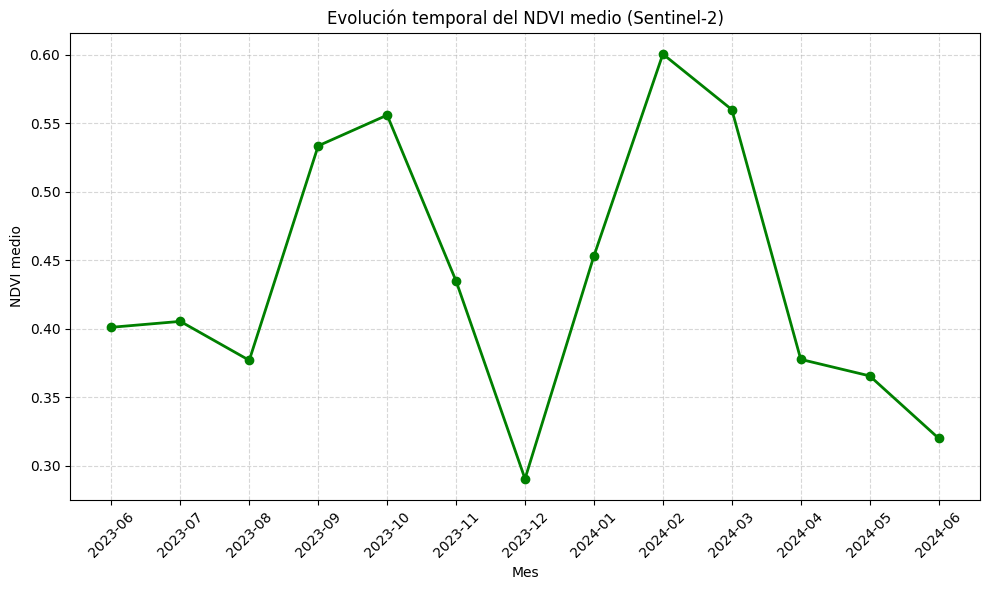

In [21]:
import numpy as np

# Crear una lista para guardar la media de NDVI de cada raster
ndvi_means = []
meses = [
    "2023-06", "2023-07", "2023-08", "2023-09", "2023-10", "2023-11", "2023-12",
    "2024-01", "2024-02", "2024-03", "2024-04", "2024-05", "2024-06"
]

for archivo in archivos:
    fpath = os.path.join(data_dir, archivo)
    with rasterio.open(fpath) as src:
        img = src.read(1)
        # Enmascara nodata (que se puso como None antes)
        if src.nodata is not None:
            mask = img != src.nodata
            ndvi_mean = img[mask].mean()
        else:
            ndvi_mean = np.nanmean(img)
        ndvi_means.append(ndvi_mean)

# Graficar
plt.figure(figsize=(10,6))
plt.plot(meses, ndvi_means, marker='o', color='green', linewidth=2)
plt.xticks(rotation=45)
plt.xlabel("Mes")
plt.ylabel("NDVI medio")
plt.title("Evolución temporal del NDVI medio (Sentinel-2)")
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


Leyendo raster 9_NDVI_con_recortes.tif...
Dimensiones: 2897 x 2890
Bandas NDVI leidas: 13
Categorias invierno encontradas: [16, 17, 18, 20]
Categorias verano encontradas: [10, 11, 12, 18, 21, 22, 26]


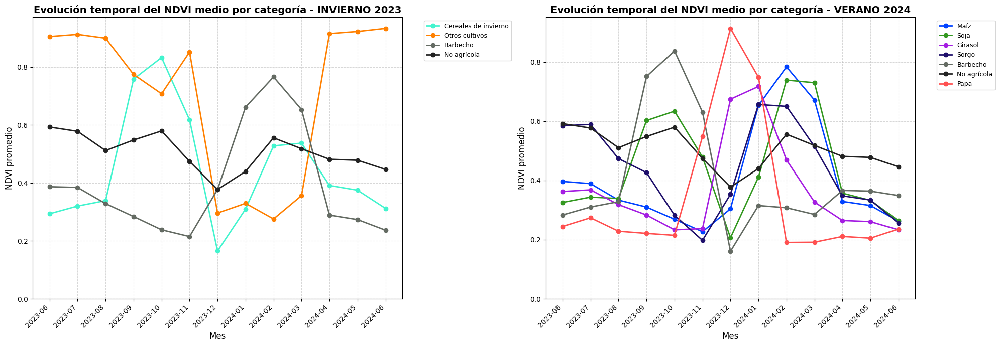


Grafico generado con 4 categorias de invierno y 7 categorias de verano


In [30]:
import numpy as np
import rasterio
import xml.etree.ElementTree as ET
from collections import defaultdict

# Paths
raster_path = os.path.join("..", "data", "proc", "9_NDVI_con_recortes.tif")
qml_path_inv = os.path.join("..", "data", "raw", "INTA_23_24", "MNC_inv23.qml")
qml_path_ver = os.path.join("..", "data", "raw", "INTA_23_24", "MNC_ver24.qml")

# Meses correspondientes a las bandas 7-19 (NDVI temporal)
meses = [
    "2023-06", "2023-07", "2023-08", "2023-09", "2023-10", "2023-11", "2023-12",
    "2024-01", "2024-02", "2024-03", "2024-04", "2024-05", "2024-06"
]

# Función para parsear colores y labels del QML
def parsear_qml(qml_path):
    tree = ET.parse(qml_path)
    root = tree.getroot()
    
    colores_por_categoria = {}
    labels_por_categoria = {}
    
    for it in root.iter('item'):
        label = it.get('label')
        value = it.get('value')
        color = it.get('color')
        if label and value:
            cat_val = int(float(value))
            labels_por_categoria[cat_val] = label
            
            if color is None:
                colores_por_categoria[cat_val] = "#888888"
            elif color.startswith("#"):
                colores_por_categoria[cat_val] = color
            elif "," in color:
                rgb_split = color.split(",")
                try:
                    rgb = tuple(map(int, rgb_split[:3]))
                    colores_por_categoria[cat_val] = '#{:02x}{:02x}{:02x}'.format(*rgb)
                except:
                    colores_por_categoria[cat_val] = "#888888"
            else:
                colores_por_categoria[cat_val] = "#888888"
    
    return colores_por_categoria, labels_por_categoria

# Parsear QMLs
colores_inv, labels_inv = parsear_qml(qml_path_inv)
colores_ver, labels_ver = parsear_qml(qml_path_ver)

# Definir color más oscuro para categoría "No agrícola" (buscar cat y modificar)
# Se asume que la categoría "No agrícola" está identificada en el label, ambos para invierno y verano
def asignar_color_no_agricola(colores_dict, labels_dict, color_especial="#222222"):
    for cat_val, label in labels_dict.items():
        if "no agricola" in label.lower() or "no agrícola" in label.lower():
            colores_dict[cat_val] = color_especial

# Aplicar color especial para "no agrícola"
asignar_color_no_agricola(colores_inv, labels_inv, color_especial="#222222")
asignar_color_no_agricola(colores_ver, labels_ver, color_especial="#222222")

# Leer el raster
print("Leyendo raster 9_NDVI_con_recortes.tif...")
with rasterio.open(raster_path) as src:
    # Leer banda 1 (invierno) y banda 2 (verano) - categorías
    banda_invierno = src.read(1)
    banda_verano = src.read(2)
    
    # Leer bandas 7-19 (NDVI temporal)
    bandas_ndvi = []
    for i in range(7, 20):  # Bandas 7 a 19
        banda = src.read(i)
        # Manejar nodata
        if src.nodata is not None:
            banda = banda.astype(np.float32)
            banda[banda == src.nodata] = np.nan
        else:
            banda = banda.astype(np.float32)
        bandas_ndvi.append(banda)
    
    print(f"Dimensiones: {src.height} x {src.width}")
    print(f"Bandas NDVI leidas: {len(bandas_ndvi)}")

# Obtener categorías únicas para invierno y verano
categorias_inv = np.unique(banda_invierno)
categorias_inv = [c for c in categorias_inv if not (np.isnan(c) or c == 0 or c == 255)]
categorias_inv = sorted([int(c) for c in categorias_inv])

categorias_ver = np.unique(banda_verano)
categorias_ver = [c for c in categorias_ver if not (np.isnan(c) or c == 0 or c == 255)]
categorias_ver = sorted([int(c) for c in categorias_ver])

print(f"Categorias invierno encontradas: {categorias_inv}")
print(f"Categorias verano encontradas: {categorias_ver}")

# Calcular NDVI promedio por categoría y por mes para invierno
ndvi_por_categoria_inv = defaultdict(list)
for idx_mes, banda_ndvi in enumerate(bandas_ndvi):
    for cat_val in categorias_inv:
        mask_categoria = (banda_invierno == cat_val)
        mask_valido = ~np.isnan(banda_ndvi)
        mask_final = mask_categoria & mask_valido
        
        if np.sum(mask_final) > 0:
            ndvi_promedio = np.nanmean(banda_ndvi[mask_final])
        else:
            ndvi_promedio = np.nan
        
        ndvi_por_categoria_inv[cat_val].append(ndvi_promedio)

# Calcular NDVI promedio por categoría y por mes para verano
ndvi_por_categoria_ver = defaultdict(list)
for idx_mes, banda_ndvi in enumerate(bandas_ndvi):
    for cat_val in categorias_ver:
        mask_categoria = (banda_verano == cat_val)
        mask_valido = ~np.isnan(banda_ndvi)
        mask_final = mask_categoria & mask_valido
        
        if np.sum(mask_final) > 0:
            ndvi_promedio = np.nanmean(banda_ndvi[mask_final])
        else:
            ndvi_promedio = np.nan
        
        ndvi_por_categoria_ver[cat_val].append(ndvi_promedio)

# Crear el gráfico con layout de 1 fila y 2 columnas
fig, axes = plt.subplots(1, 2, figsize=(20, 7))

# Subplot izquierdo: INVIERNO
ax_inv = axes[0]
for cat_val in categorias_inv:
    valores_ndvi = ndvi_por_categoria_inv[cat_val]
    label = labels_inv.get(cat_val, f"Categoría {cat_val}")
    color = colores_inv.get(cat_val, None)
    
    if any(not np.isnan(v) for v in valores_ndvi):
        ax_inv.plot(meses, valores_ndvi, marker='o', label=label, 
                   color=color if color else None, linewidth=2, markersize=6)

ax_inv.set_xticks(range(len(meses)))
ax_inv.set_xticklabels(meses, rotation=45, ha='right')
ax_inv.set_xlabel("Mes", fontsize=12)
ax_inv.set_ylabel("NDVI promedio", fontsize=12)
ax_inv.set_title("Evolución temporal del NDVI medio por categoría - INVIERNO 2023", 
                fontsize=14, fontweight='bold')
ax_inv.grid(True, linestyle='--', alpha=0.5)
ax_inv.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
ax_inv.set_ylim(bottom=0)

# Subplot derecho: VERANO
ax_ver = axes[1]
for cat_val in categorias_ver:
    valores_ndvi = ndvi_por_categoria_ver[cat_val]
    label = labels_ver.get(cat_val, f"Categoría {cat_val}")
    color = colores_ver.get(cat_val, None)
    
    if any(not np.isnan(v) for v in valores_ndvi):
        ax_ver.plot(meses, valores_ndvi, marker='o', label=label, 
                   color=color if color else None, linewidth=2, markersize=6)

ax_ver.set_xticks(range(len(meses)))
ax_ver.set_xticklabels(meses, rotation=45, ha='right')
ax_ver.set_xlabel("Mes", fontsize=12)
ax_ver.set_ylabel("NDVI promedio", fontsize=12)
ax_ver.set_title("Evolución temporal del NDVI medio por categoría - VERANO 2024", 
                fontsize=14, fontweight='bold')
ax_ver.grid(True, linestyle='--', alpha=0.5)
ax_ver.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
ax_ver.set_ylim(bottom=0)

plt.tight_layout()
plt.show()

print(f"\nGrafico generado con {len(categorias_inv)} categorias de invierno y {len(categorias_ver)} categorias de verano")


Leyendo raster 9_NDVI_con_recortes.tif...
Dimensiones: 2897 x 2890
Mediana: Media=0.3739, Mediana=0.3429, Std=0.1392, N=8,372,330
Mínimo: Media=0.1998, Mediana=0.1822, Std=0.1041, N=8,372,330
Máximo: Media=0.8112, Mediana=0.8491, Std=0.1354, N=8,372,330
Desviación estándar: Media=0.2017, Mediana=0.2162, Std=0.0634, N=8,372,330


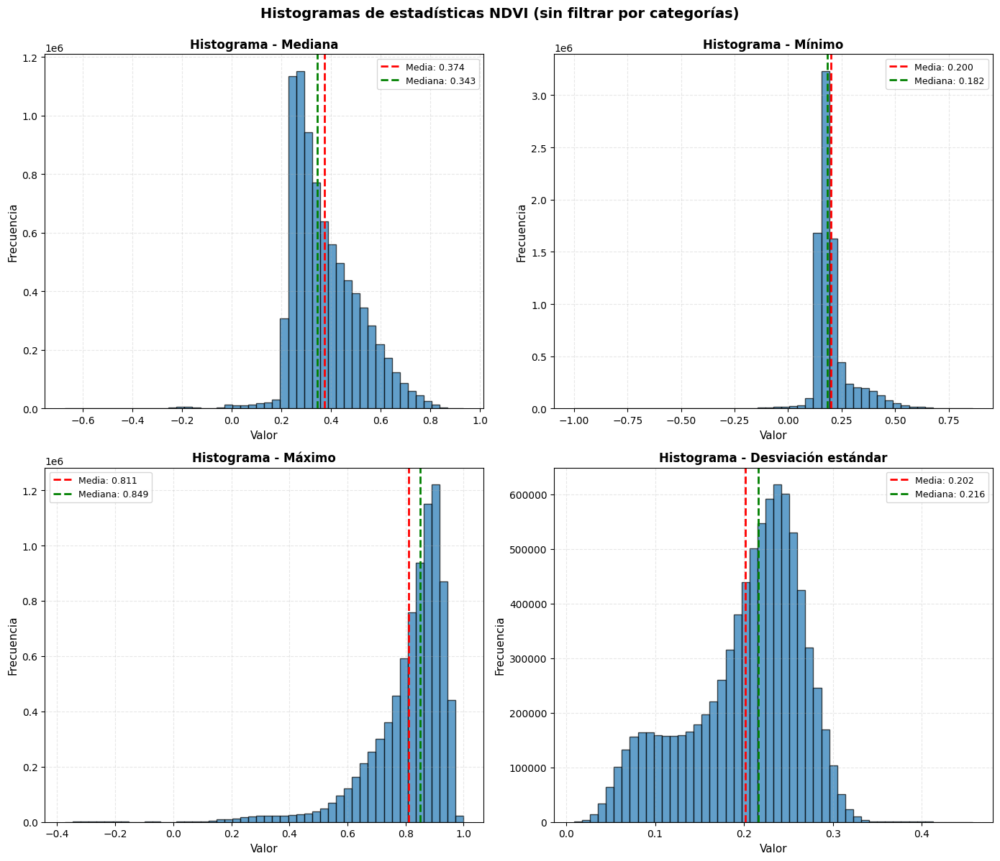

In [31]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt

# Paths
raster_path = os.path.join("..", "data", "proc", "9_NDVI_con_recortes.tif")

# Nombres de las bandas estadísticas
nombres_bandas = {
    3: "Mediana",
    4: "Mínimo",
    5: "Máximo",
    6: "Desviación estándar"
}

# Leer el raster
print("Leyendo raster 9_NDVI_con_recortes.tif...")
with rasterio.open(raster_path) as src:
    # Leer bandas 3, 4, 5, 6 (estadísticas)
    bandas_estadisticas = {}
    for i in range(3, 7):
        banda = src.read(i)
        # Manejar nodata
        if src.nodata is not None:
            banda = banda.astype(np.float32)
            banda[banda == src.nodata] = np.nan
        else:
            banda = banda.astype(np.float32)
        bandas_estadisticas[i] = banda
    
    print(f"Dimensiones: {src.height} x {src.width}")

# Crear visualización faceteada 2x2
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

for idx, (banda_num, nombre) in enumerate(nombres_bandas.items()):
    ax = axes[idx]
    datos = bandas_estadisticas[banda_num]
    
    # Filtrar valores válidos (no nan)
    datos_validos = datos[~np.isnan(datos)]
    
    # Crear histograma
    ax.hist(datos_validos, bins=50, edgecolor='black', alpha=0.7)
    ax.set_xlabel("Valor", fontsize=11)
    ax.set_ylabel("Frecuencia", fontsize=11)
    ax.set_title(f"Histograma - {nombre}", fontsize=12, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.3)
    
    # Añadir estadísticas descriptivas
    media = np.nanmean(datos_validos)
    mediana = np.nanmedian(datos_validos)
    std = np.nanstd(datos_validos)
    ax.axvline(media, color='red', linestyle='--', linewidth=2, label=f'Media: {media:.3f}')
    ax.axvline(mediana, color='green', linestyle='--', linewidth=2, label=f'Mediana: {mediana:.3f}')
    ax.legend(fontsize=9)
    
    print(f"{nombre}: Media={media:.4f}, Mediana={mediana:.4f}, Std={std:.4f}, N={len(datos_validos):,}")

plt.suptitle("Histogramas de estadísticas NDVI (sin filtrar por categorías)", 
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()


Leyendo raster 9_NDVI_con_recortes.tif...
Dimensiones: 2897 x 2890
Categorias verano encontradas: [10, 11, 12, 18, 21, 22, 26]


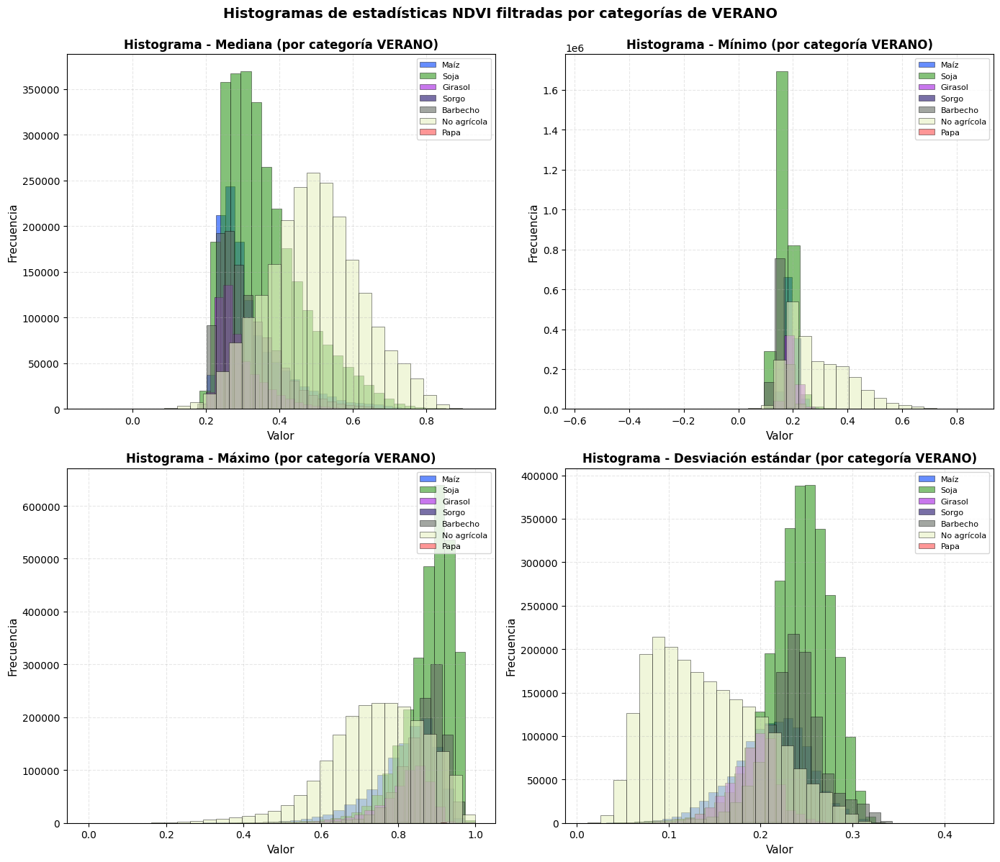


Grafico generado con 7 categorias de verano


In [41]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET

# Paths
raster_path = os.path.join("..", "data", "proc", "9_NDVI_con_recortes.tif")
qml_path_ver = os.path.join("..", "data", "raw", "INTA_23_24", "MNC_ver24.qml")

# Nombres de las bandas estadísticas
nombres_bandas = {
    3: "Mediana",
    4: "Mínimo",
    5: "Máximo",
    6: "Desviación estándar"
}

# Parsear colores y labels del QML de verano
def parsear_qml(qml_path):
    tree = ET.parse(qml_path)
    root = tree.getroot()
    
    colores_por_categoria = {}
    labels_por_categoria = {}
    
    for it in root.iter('item'):
        label = it.get('label')
        value = it.get('value')
        color = it.get('color')
        if label and value:
            cat_val = int(float(value))
            labels_por_categoria[cat_val] = label
            
            if color is None:
                colores_por_categoria[cat_val] = "#888888"
            elif color.startswith("#"):
                colores_por_categoria[cat_val] = color
            elif "," in color:
                rgb_split = color.split(",")
                try:
                    rgb = tuple(map(int, rgb_split[:3]))
                    colores_por_categoria[cat_val] = '#{:02x}{:02x}{:02x}'.format(*rgb)
                except:
                    colores_por_categoria[cat_val] = "#888888"
            else:
                colores_por_categoria[cat_val] = "#888888"
    
    return colores_por_categoria, labels_por_categoria

colores_ver, labels_ver = parsear_qml(qml_path_ver)

# Leer el raster
print("Leyendo raster 9_NDVI_con_recortes.tif...")
with rasterio.open(raster_path) as src:
    # Leer banda 2 (verano) - categorías
    banda_verano = src.read(2)
    
    # Leer bandas 3, 4, 5, 6 (estadísticas)
    bandas_estadisticas = {}
    for i in range(3, 7):
        banda = src.read(i)
        # Manejar nodata
        if src.nodata is not None:
            banda = banda.astype(np.float32)
            banda[banda == src.nodata] = np.nan
        else:
            banda = banda.astype(np.float32)
        bandas_estadisticas[i] = banda
    
    print(f"Dimensiones: {src.height} x {src.width}")

# Obtener categorías únicas de verano
categorias_ver = np.unique(banda_verano)
categorias_ver = [c for c in categorias_ver if not (np.isnan(c) or c == 0 or c == 255)]
categorias_ver = sorted([int(c) for c in categorias_ver])

print(f"Categorias verano encontradas: {categorias_ver}")

# Crear visualización faceteada 2x2
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

for idx, (banda_num, nombre) in enumerate(nombres_bandas.items()):
    ax = axes[idx]
    datos = bandas_estadisticas[banda_num]
    
    # Graficar histograma para cada categoría de verano
    for cat_val in categorias_ver:
        mask_categoria = (banda_verano == cat_val)
        datos_categoria = datos[mask_categoria & ~np.isnan(datos)]
        
        if len(datos_categoria) > 0:
            label = labels_ver.get(cat_val, f"Categoría {cat_val}")
            color = colores_ver.get(cat_val, None)
            ax.hist(datos_categoria, bins=30, alpha=0.6, label=label, 
                   color=color if color else None, edgecolor='black', linewidth=0.5)
    
    ax.set_xlabel("Valor", fontsize=11)
    ax.set_ylabel("Frecuencia", fontsize=11)
    ax.set_title(f"Histograma - {nombre} (por categoría VERANO)", fontsize=12, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.3)
    ax.legend(fontsize=8, loc='upper right')

plt.suptitle("Histogramas de estadísticas NDVI filtradas por categorías de VERANO", 
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

print(f"\nGrafico generado con {len(categorias_ver)} categorias de verano")


Leyendo raster 9_NDVI_con_recortes.tif...
Dimensiones: 2897 x 2890
Categorias invierno encontradas: [16, 17, 18, 20]


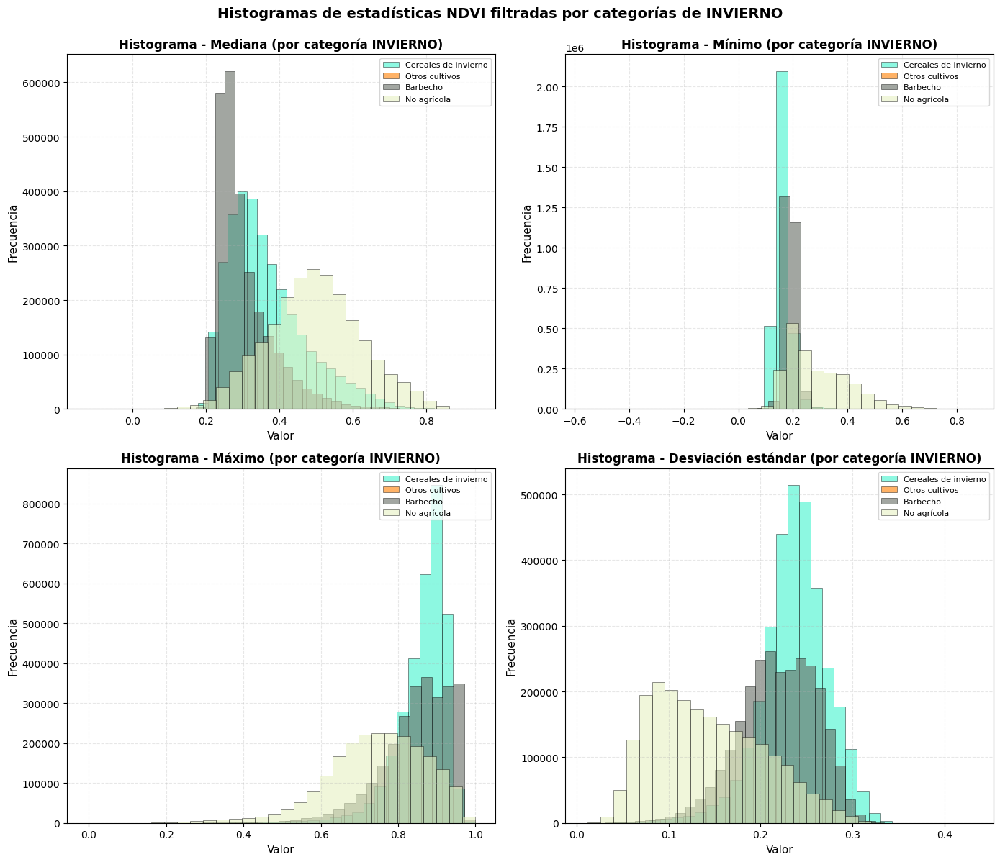


Grafico generado con 4 categorias de invierno


In [34]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET

# Paths
raster_path = os.path.join("..", "data", "proc", "9_NDVI_con_recortes.tif")
qml_path_inv = os.path.join("..", "data", "raw", "INTA_23_24", "MNC_inv23.qml")

# Nombres de las bandas estadísticas
nombres_bandas = {
    3: "Mediana",
    4: "Mínimo",
    5: "Máximo",
    6: "Desviación estándar"
}

# Parsear colores y labels del QML de invierno
def parsear_qml(qml_path):
    tree = ET.parse(qml_path)
    root = tree.getroot()
    
    colores_por_categoria = {}
    labels_por_categoria = {}
    
    for it in root.iter('item'):
        label = it.get('label')
        value = it.get('value')
        color = it.get('color')
        if label and value:
            cat_val = int(float(value))
            labels_por_categoria[cat_val] = label
            
            if color is None:
                colores_por_categoria[cat_val] = "#888888"
            elif color.startswith("#"):
                colores_por_categoria[cat_val] = color
            elif "," in color:
                rgb_split = color.split(",")
                try:
                    rgb = tuple(map(int, rgb_split[:3]))
                    colores_por_categoria[cat_val] = '#{:02x}{:02x}{:02x}'.format(*rgb)
                except:
                    colores_por_categoria[cat_val] = "#888888"
            else:
                colores_por_categoria[cat_val] = "#888888"
    
    return colores_por_categoria, labels_por_categoria

colores_inv, labels_inv = parsear_qml(qml_path_inv)

# Leer el raster
print("Leyendo raster 9_NDVI_con_recortes.tif...")
with rasterio.open(raster_path) as src:
    # Leer banda 1 (invierno) - categorías
    banda_invierno = src.read(1)
    
    # Leer bandas 3, 4, 5, 6 (estadísticas)
    bandas_estadisticas = {}
    for i in range(3, 7):
        banda = src.read(i)
        # Manejar nodata
        if src.nodata is not None:
            banda = banda.astype(np.float32)
            banda[banda == src.nodata] = np.nan
        else:
            banda = banda.astype(np.float32)
        bandas_estadisticas[i] = banda
    
    print(f"Dimensiones: {src.height} x {src.width}")

# Obtener categorías únicas de invierno
categorias_inv = np.unique(banda_invierno)
categorias_inv = [c for c in categorias_inv if not (np.isnan(c) or c == 0 or c == 255)]
categorias_inv = sorted([int(c) for c in categorias_inv])

print(f"Categorias invierno encontradas: {categorias_inv}")

# Crear visualización faceteada 2x2
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

for idx, (banda_num, nombre) in enumerate(nombres_bandas.items()):
    ax = axes[idx]
    datos = bandas_estadisticas[banda_num]
    
    # Graficar histograma para cada categoría de invierno
    for cat_val in categorias_inv:
        mask_categoria = (banda_invierno == cat_val)
        datos_categoria = datos[mask_categoria & ~np.isnan(datos)]
        
        if len(datos_categoria) > 0:
            label = labels_inv.get(cat_val, f"Categoría {cat_val}")
            color = colores_inv.get(cat_val, None)
            ax.hist(datos_categoria, bins=30, alpha=0.6, label=label, 
                   color=color if color else None, edgecolor='black', linewidth=0.5)
    
    ax.set_xlabel("Valor", fontsize=11)
    ax.set_ylabel("Frecuencia", fontsize=11)
    ax.set_title(f"Histograma - {nombre} (por categoría INVIERNO)", fontsize=12, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.3)
    ax.legend(fontsize=8, loc='upper right')

plt.suptitle("Histogramas de estadísticas NDVI filtradas por categorías de INVIERNO", 
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

print(f"\nGrafico generado con {len(categorias_inv)} categorias de invierno")


Leyendo raster 9_NDVI_con_recortes.tif...
Dimensiones: 2897 x 2890
Categorias verano encontradas: [10, 11, 12, 18, 21, 22, 26]


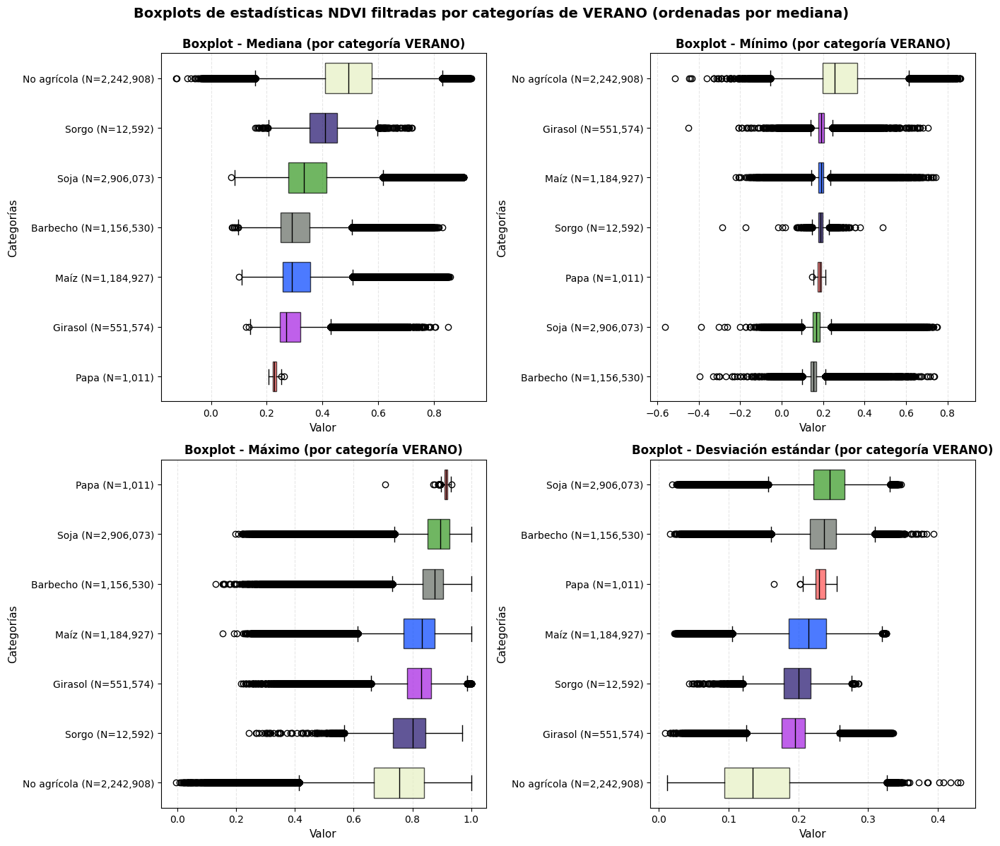


Grafico generado con 7 categorias de verano


In [42]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET

# Paths
raster_path = os.path.join("..", "data", "proc", "9_NDVI_con_recortes.tif")
qml_path_ver = os.path.join("..", "data", "raw", "INTA_23_24", "MNC_ver24.qml")

# Nombres de las bandas estadísticas
nombres_bandas = {
    3: "Mediana",
    4: "Mínimo",
    5: "Máximo",
    6: "Desviación estándar"
}

# Parsear colores y labels del QML de verano
def parsear_qml(qml_path):
    tree = ET.parse(qml_path)
    root = tree.getroot()
    
    colores_por_categoria = {}
    labels_por_categoria = {}
    
    for it in root.iter('item'):
        label = it.get('label')
        value = it.get('value')
        color = it.get('color')
        if label and value:
            cat_val = int(float(value))
            labels_por_categoria[cat_val] = label
            
            if color is None:
                colores_por_categoria[cat_val] = "#888888"
            elif color.startswith("#"):
                colores_por_categoria[cat_val] = color
            elif "," in color:
                rgb_split = color.split(",")
                try:
                    rgb = tuple(map(int, rgb_split[:3]))
                    colores_por_categoria[cat_val] = '#{:02x}{:02x}{:02x}'.format(*rgb)
                except:
                    colores_por_categoria[cat_val] = "#888888"
            else:
                colores_por_categoria[cat_val] = "#888888"
    
    return colores_por_categoria, labels_por_categoria

colores_ver, labels_ver = parsear_qml(qml_path_ver)

# Leer el raster
print("Leyendo raster 9_NDVI_con_recortes.tif...")
with rasterio.open(raster_path) as src:
    # Leer banda 2 (verano) - categorías
    banda_verano = src.read(2)
    
    # Leer bandas 3, 4, 5, 6 (estadísticas)
    bandas_estadisticas = {}
    for i in range(3, 7):
        banda = src.read(i)
        # Manejar nodata
        if src.nodata is not None:
            banda = banda.astype(np.float32)
            banda[banda == src.nodata] = np.nan
        else:
            banda = banda.astype(np.float32)
        bandas_estadisticas[i] = banda
    
    print(f"Dimensiones: {src.height} x {src.width}")

# Obtener categorías únicas de verano
categorias_ver = np.unique(banda_verano)
categorias_ver = [c for c in categorias_ver if not (np.isnan(c) or c == 0 or c == 255)]
categorias_ver = sorted([int(c) for c in categorias_ver])

print(f"Categorias verano encontradas: {categorias_ver}")

# Crear visualización faceteada 2x2
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

for idx, (banda_num, nombre) in enumerate(nombres_bandas.items()):
    ax = axes[idx]
    datos = bandas_estadisticas[banda_num]
    
    # Recopilar datos por categoría
    datos_por_categoria = []
    labels_ordenados = []
    colores_ordenados = []
    medianas_por_categoria = []
    n_pixeles = []
    
    for cat_val in categorias_ver:
        mask_categoria = (banda_verano == cat_val)
        datos_categoria = datos[mask_categoria & ~np.isnan(datos)]
        
        if len(datos_categoria) > 0:
            datos_por_categoria.append(datos_categoria)
            label_base = labels_ver.get(cat_val, f"Categoría {cat_val}")
            n = len(datos_categoria)
            labels_ordenados.append(f"{label_base} (N={n:,})")
            colores_ordenados.append(colores_ver.get(cat_val, "#888888"))
            medianas_por_categoria.append(np.median(datos_categoria))
            n_pixeles.append(n)
    
    # Ordenar por mediana (menor a mayor)
    if len(datos_por_categoria) > 0:
        indices_ordenados = sorted(range(len(medianas_por_categoria)), 
                                   key=lambda i: medianas_por_categoria[i])
        
        datos_ordenados = [datos_por_categoria[i] for i in indices_ordenados]
        labels_ordenados_final = [labels_ordenados[i] for i in indices_ordenados]
        colores_ordenados_final = [colores_ordenados[i] for i in indices_ordenados]
        
        # Crear boxplots
        bp = ax.boxplot(datos_ordenados, tick_labels=labels_ordenados_final, 
                       vert=False, patch_artist=True, widths=0.6)
        
        # Aplicar colores a los boxplots
        for patch, color in zip(bp['boxes'], colores_ordenados_final):
            patch.set_facecolor(color)
            patch.set_alpha(0.7)
        
        # Estilo de las líneas
        for element in ['whiskers', 'fliers', 'means', 'medians', 'caps']:
            plt.setp(bp[element], color='black', linewidth=1)
    
    ax.set_xlabel("Valor", fontsize=11)
    ax.set_ylabel("Categorías", fontsize=11)
    ax.set_title(f"Boxplot - {nombre} (por categoría VERANO)", fontsize=12, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.3, axis='x')

plt.suptitle("Boxplots de estadísticas NDVI filtradas por categorías de VERANO (ordenadas por mediana)", 
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

print(f"\nGrafico generado con {len(categorias_ver)} categorias de verano")


Leyendo raster 9_NDVI_con_recortes.tif...
Dimensiones: 2897 x 2890
Categorias invierno encontradas: [16, 17, 18, 20]


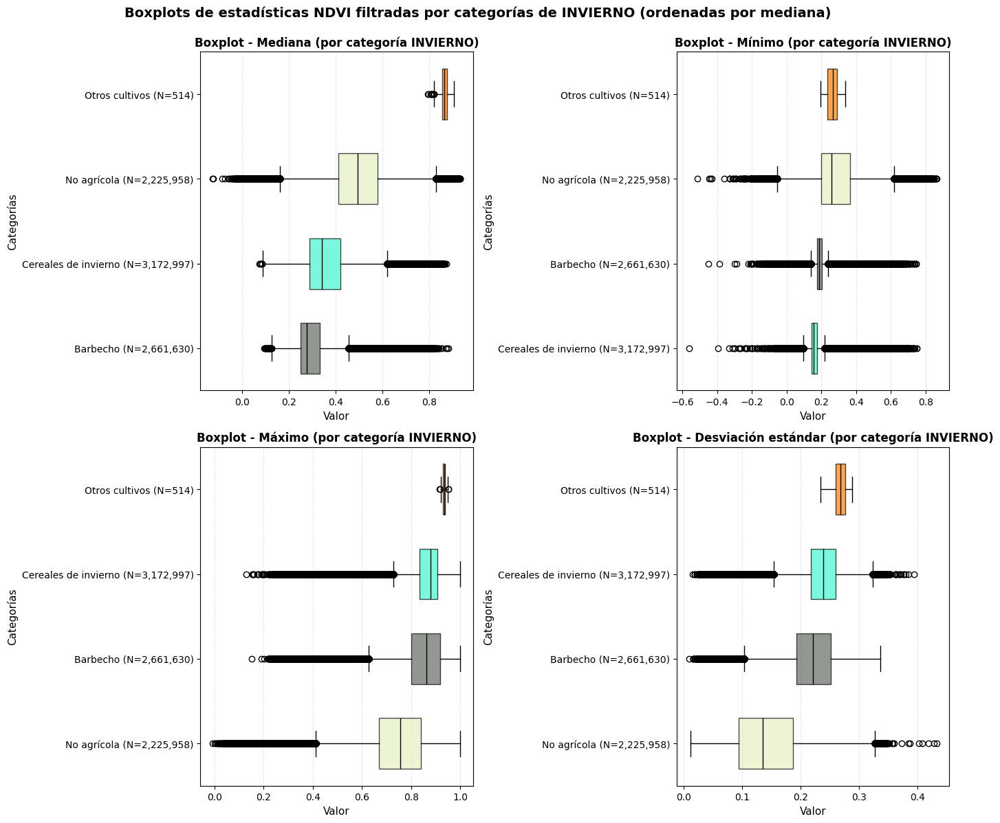


Grafico generado con 4 categorias de invierno


In [40]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET

# Paths
raster_path = os.path.join("..", "data", "proc", "9_NDVI_con_recortes.tif")
qml_path_inv = os.path.join("..", "data", "raw", "INTA_23_24", "MNC_inv23.qml")

# Nombres de las bandas estadísticas
nombres_bandas = {
    3: "Mediana",
    4: "Mínimo",
    5: "Máximo",
    6: "Desviación estándar"
}

# Parsear colores y labels del QML de invierno
def parsear_qml(qml_path):
    tree = ET.parse(qml_path)
    root = tree.getroot()
    
    colores_por_categoria = {}
    labels_por_categoria = {}
    
    for it in root.iter('item'):
        label = it.get('label')
        value = it.get('value')
        color = it.get('color')
        if label and value:
            cat_val = int(float(value))
            labels_por_categoria[cat_val] = label
            
            if color is None:
                colores_por_categoria[cat_val] = "#888888"
            elif color.startswith("#"):
                colores_por_categoria[cat_val] = color
            elif "," in color:
                rgb_split = color.split(",")
                try:
                    rgb = tuple(map(int, rgb_split[:3]))
                    colores_por_categoria[cat_val] = '#{:02x}{:02x}{:02x}'.format(*rgb)
                except:
                    colores_por_categoria[cat_val] = "#888888"
            else:
                colores_por_categoria[cat_val] = "#888888"
    
    return colores_por_categoria, labels_por_categoria

colores_inv, labels_inv = parsear_qml(qml_path_inv)

# Leer el raster
print("Leyendo raster 9_NDVI_con_recortes.tif...")
with rasterio.open(raster_path) as src:
    # Leer banda 1 (invierno) - categorías
    banda_invierno = src.read(1)
    
    # Leer bandas 3, 4, 5, 6 (estadísticas)
    bandas_estadisticas = {}
    for i in range(3, 7):
        banda = src.read(i)
        # Manejar nodata
        if src.nodata is not None:
            banda = banda.astype(np.float32)
            banda[banda == src.nodata] = np.nan
        else:
            banda = banda.astype(np.float32)
        bandas_estadisticas[i] = banda
    
    print(f"Dimensiones: {src.height} x {src.width}")

# Obtener categorías únicas de invierno
categorias_inv = np.unique(banda_invierno)
categorias_inv = [c for c in categorias_inv if not (np.isnan(c) or c == 0 or c == 255)]
categorias_inv = sorted([int(c) for c in categorias_inv])

print(f"Categorias invierno encontradas: {categorias_inv}")

# Crear visualización faceteada 2x2
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

for idx, (banda_num, nombre) in enumerate(nombres_bandas.items()):
    ax = axes[idx]
    datos = bandas_estadisticas[banda_num]
    
    # Recopilar datos por categoría
    datos_por_categoria = []
    labels_ordenados = []
    colores_ordenados = []
    medianas_por_categoria = []
    n_pixeles = []
    
    for cat_val in categorias_inv:
        mask_categoria = (banda_invierno == cat_val)
        datos_categoria = datos[mask_categoria & ~np.isnan(datos)]
        
        if len(datos_categoria) > 0:
            datos_por_categoria.append(datos_categoria)
            label_base = labels_inv.get(cat_val, f"Categoría {cat_val}")
            n = len(datos_categoria)
            labels_ordenados.append(f"{label_base} (N={n:,})")
            colores_ordenados.append(colores_inv.get(cat_val, "#888888"))
            medianas_por_categoria.append(np.median(datos_categoria))
            n_pixeles.append(n)
    
    # Ordenar por mediana (menor a mayor)
    if len(datos_por_categoria) > 0:
        indices_ordenados = sorted(range(len(medianas_por_categoria)), 
                                   key=lambda i: medianas_por_categoria[i])
        
        datos_ordenados = [datos_por_categoria[i] for i in indices_ordenados]
        labels_ordenados_final = [labels_ordenados[i] for i in indices_ordenados]
        colores_ordenados_final = [colores_ordenados[i] for i in indices_ordenados]
        
        # Crear boxplots
        bp = ax.boxplot(datos_ordenados, tick_labels=labels_ordenados_final, 
                       vert=False, patch_artist=True, widths=0.6)
        
        # Aplicar colores a los boxplots
        for patch, color in zip(bp['boxes'], colores_ordenados_final):
            patch.set_facecolor(color)
            patch.set_alpha(0.7)
        
        # Estilo de las líneas
        for element in ['whiskers', 'fliers', 'means', 'medians', 'caps']:
            plt.setp(bp[element], color='black', linewidth=1)
    
    ax.set_xlabel("Valor", fontsize=11)
    ax.set_ylabel("Categorías", fontsize=11)
    ax.set_title(f"Boxplot - {nombre} (por categoría INVIERNO)", fontsize=12, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.3, axis='x')

plt.suptitle("Boxplots de estadísticas NDVI filtradas por categorías de INVIERNO (ordenadas por mediana)", 
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

print(f"\nGrafico generado con {len(categorias_inv)} categorias de invierno")


Leyendo raster 9_NDVI_con_recortes.tif...
Dimensiones: 2897 x 2890
CRS: EPSG:32721


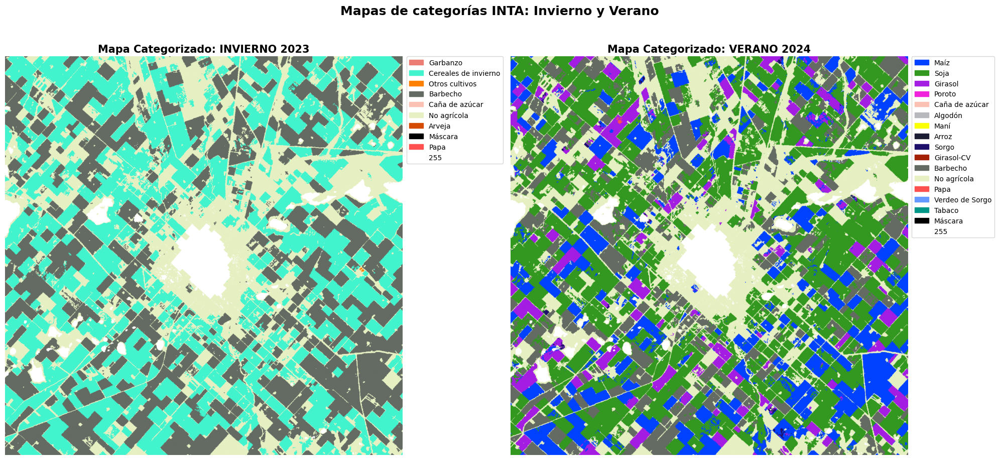


Mapas generados:
  Invierno: 10 categorias
  Verano: 17 categorias


In [37]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap, BoundaryNorm
import xml.etree.ElementTree as ET

# Paths
raster_path = os.path.join("..", "data", "proc", "9_NDVI_con_recortes.tif")
qml_path_inv = os.path.join("..", "data", "raw", "INTA_23_24", "MNC_inv23.qml")
qml_path_ver = os.path.join("..", "data", "raw", "INTA_23_24", "MNC_ver24.qml")

# Función para parsear QML y crear colormap
def parsear_qml_para_colormap(qml_path):
    tree = ET.parse(qml_path)
    root = tree.getroot()
    
    vals = []
    labels = []
    hex_colors = []
    
    for it in root.iter('item'):
        label = it.get('label')
        value = it.get('value')
        color = it.get('color')
        if label and value:
            vals.append(int(float(value)))
            labels.append(label)
            
            if color is None:
                hex_colors.append("#888888")
            elif color.startswith("#"):
                hex_colors.append(color)
            elif "," in color:
                rgb_split = color.split(",")
                try:
                    rgb = tuple(map(int, rgb_split[:3]))
                    hex_colors.append('#{:02x}{:02x}{:02x}'.format(*rgb))
                except:
                    hex_colors.append("#888888")
            else:
                hex_colors.append("#888888")
    
    # Ordenar por valor
    z = sorted(zip(vals, hex_colors, labels), key=lambda t: t[0])
    vals, hex_colors, labels = [list(x) for x in zip(*z)]
    
    # Para BoundaryNorm
    boundaries = vals + [vals[-1] + 1]
    cmap = ListedColormap(hex_colors)
    norm = BoundaryNorm(boundaries, ncolors=len(hex_colors))
    
    return vals, hex_colors, labels, cmap, norm

# Parsear QMLs
vals_inv, hex_colors_inv, labels_inv, cmap_inv, norm_inv = parsear_qml_para_colormap(qml_path_inv)
vals_ver, hex_colors_ver, labels_ver, cmap_ver, norm_ver = parsear_qml_para_colormap(qml_path_ver)

# Leer el raster
print("Leyendo raster 9_NDVI_con_recortes.tif...")
with rasterio.open(raster_path) as src:
    # Leer banda 1 (invierno) y banda 2 (verano)
    banda_invierno = src.read(1)
    banda_verano = src.read(2)
    
    # Obtener extent
    extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
    
    print(f"Dimensiones: {src.height} x {src.width}")
    print(f"CRS: {src.crs}")

# Crear visualización 1 fila y 2 columnas
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Subplot izquierdo: INVIERNO
ax_inv = axes[0]
im_inv = ax_inv.imshow(banda_invierno, cmap=cmap_inv, norm=norm_inv, extent=extent, origin='upper')
ax_inv.set_title("Mapa Categorizado: INVIERNO 2023", fontsize=15, fontweight='bold')
ax_inv.axis("off")

# Leyenda para invierno
handles_inv = [mpatches.Patch(color=hex_colors_inv[i], label=labels_inv[i]) 
               for i in range(len(labels_inv))]
ax_inv.legend(handles=handles_inv, bbox_to_anchor=(1.01, 1), loc='upper left', 
              borderaxespad=0., fontsize=10)

# Subplot derecho: VERANO
ax_ver = axes[1]
im_ver = ax_ver.imshow(banda_verano, cmap=cmap_ver, norm=norm_ver, extent=extent, origin='upper')
ax_ver.set_title("Mapa Categorizado: VERANO 2024", fontsize=15, fontweight='bold')
ax_ver.axis("off")

# Leyenda para verano
handles_ver = [mpatches.Patch(color=hex_colors_ver[i], label=labels_ver[i]) 
               for i in range(len(labels_ver))]
ax_ver.legend(handles=handles_ver, bbox_to_anchor=(1.01, 1), loc='upper left', 
              borderaxespad=0., fontsize=10)

plt.suptitle("Mapas de categorías INTA: Invierno y Verano", fontsize=18, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

print(f"\nMapas generados:")
print(f"  Invierno: {len(labels_inv)} categorias")
print(f"  Verano: {len(labels_ver)} categorias")


In [ ]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict

# Paths
raster_path = os.path.join("..", "data", "proc", "9_NDVI_con_recortes.tif")
qml_path_inv = os.path.join("..", "data", "raw", "INTA_23_24", "MNC_inv23.qml")
qml_path_ver = os.path.join("..", "data", "raw", "INTA_23_24", "MNC_ver24.qml")

# Meses correspondientes a las bandas 7-19 (NDVI temporal)
meses = [
    "2023-06", "2023-07", "2023-08", "2023-09", "2023-10", "2023-11", "2023-12",
    "2024-01", "2024-02", "2024-03", "2024-04", "2024-05", "2024-06"
]

# Función para parsear QML y obtener categorías
def parsear_categorias_qml(qml_path):
    tree = ET.parse(qml_path)
    root = tree.getroot()
    
    categorias = {}
    for it in root.iter('item'):
        label = it.get('label')
        value = it.get('value')
        if label and value:
            cat_val = int(float(value))
            categorias[cat_val] = label
    
    return categorias

# Parsear categorías
categorias_inv = parsear_categorias_qml(qml_path_inv)
categorias_ver = parsear_categorias_qml(qml_path_ver)

# Definir grupos para INVIERNO
barbecho_inv = [18]  # Barbecho
no_agricola_inv = [20]  # No agrícola
# Todos los demás son cultivos
cultivos_inv = [cat for cat in categorias_inv.keys() 
                if cat not in barbecho_inv + no_agricola_inv + [25, 255]]  # Excluir Máscara y 255

# Definir grupos para VERANO
barbecho_ver = [21]  # Barbecho
no_agricola_ver = [22]  # No agrícola
# Todos los demás son cultivos
cultivos_ver = [cat for cat in categorias_ver.keys() 
                if cat not in barbecho_ver + no_agricola_ver + [31, 255]]  # Excluir Máscara y 255

print("Grupos INVIERNO:")
print(f"  Barbecho: {barbecho_inv}")
print(f"  No agrícola: {no_agricola_inv}")
print(f"  Cultivos: {cultivos_inv}")

print("\nGrupos VERANO:")
print(f"  Barbecho: {barbecho_ver}")
print(f"  No agrícola: {no_agricola_ver}")
print(f"  Cultivos: {cultivos_ver}")

# Leer el raster
print("\nLeyendo raster 9_NDVI_con_recortes.tif...")
with rasterio.open(raster_path) as src:
    # Leer banda 1 (invierno) y banda 2 (verano)
    banda_invierno = src.read(1)
    banda_verano = src.read(2)
    
    # Leer bandas 7-19 (NDVI temporal)
    bandas_ndvi = []
    for i in range(7, 20):  # Bandas 7 a 19
        banda = src.read(i)
        if src.nodata is not None:
            banda = banda.astype(np.float32)
            banda[banda == src.nodata] = np.nan
        else:
            banda = banda.astype(np.float32)
        bandas_ndvi.append(banda)
    
    print(f"Dimensiones: {src.height} x {src.width}")

# Función para calcular NDVI promedio por grupo
def calcular_ndvi_por_grupo(banda_categorias, bandas_ndvi, grupos, nombre_grupo):
    resultados = defaultdict(list)
    
    for idx_mes, banda_ndvi in enumerate(bandas_ndvi):
        for grupo_nombre, categorias_grupo in grupos.items():
            # Crear máscara para todas las categorías del grupo
            mask_grupo = np.zeros_like(banda_categorias, dtype=bool)
            for cat_val in categorias_grupo:
                mask_grupo |= (banda_categorias == cat_val)
            
            # Máscara para valores válidos de NDVI
            mask_valido = ~np.isnan(banda_ndvi)
            mask_final = mask_grupo & mask_valido
            
            if np.sum(mask_final) > 0:
                ndvi_promedio = np.nanmean(banda_ndvi[mask_final])
            else:
                ndvi_promedio = np.nan
            
            resultados[grupo_nombre].append(ndvi_promedio)
    
    return resultados

# Calcular para INVIERNO
grupos_inv = {
    'Barbecho': barbecho_inv,
    'No agrícola': no_agricola_inv,
    'Cultivos': cultivos_inv
}
ndvi_por_grupo_inv = calcular_ndvi_por_grupo(banda_invierno, bandas_ndvi, grupos_inv, 'invierno')

# Calcular para VERANO
grupos_ver = {
    'Barbecho': barbecho_ver,
    'No agrícola': no_agricola_ver,
    'Cultivos': cultivos_ver
}
ndvi_por_grupo_ver = calcular_ndvi_por_grupo(banda_verano, bandas_ndvi, grupos_ver, 'verano')

# Crear visualización 1 fila y 2 columnas
fig, axes = plt.subplots(1, 2, figsize=(20, 7))

# Colores para los grupos
colores_grupos = {
    'Barbecho': '#646b63',  # Gris
    'No agrícola': '#e6f0c2',  # Beige claro
    'Cultivos': '#42f4ce'  # Verde azulado
}

# Subplot izquierdo: INVIERNO
ax_inv = axes[0]
for grupo_nombre in ['Barbecho', 'No agrícola', 'Cultivos']:
    valores_ndvi = ndvi_por_grupo_inv[grupo_nombre]
    color = colores_grupos[grupo_nombre]
    
    if any(not np.isnan(v) for v in valores_ndvi):
        ax_inv.plot(meses, valores_ndvi, marker='o', label=grupo_nombre, 
                   color=color, linewidth=2.5, markersize=8)

ax_inv.set_xticks(range(len(meses)))
ax_inv.set_xticklabels(meses, rotation=45, ha='right')
ax_inv.set_xlabel("Mes", fontsize=12)
ax_inv.set_ylabel("NDVI promedio", fontsize=12)
ax_inv.set_title("Evolución temporal NDVI por grupo - INVIERNO 2023", 
                fontsize=14, fontweight='bold')
ax_inv.grid(True, linestyle='--', alpha=0.5)
ax_inv.legend(fontsize=11, loc='best')
ax_inv.set_ylim(bottom=0)

# Subplot derecho: VERANO
ax_ver = axes[1]
for grupo_nombre in ['Barbecho', 'No agrícola', 'Cultivos']:
    valores_ndvi = ndvi_por_grupo_ver[grupo_nombre]
    color = colores_grupos[grupo_nombre]
    
    if any(not np.isnan(v) for v in valores_ndvi):
        ax_ver.plot(meses, valores_ndvi, marker='o', label=grupo_nombre, 
                   color=color, linewidth=2.5, markersize=8)

ax_ver.set_xticks(range(len(meses)))
ax_ver.set_xticklabels(meses, rotation=45, ha='right')
ax_ver.set_xlabel("Mes", fontsize=12)
ax_ver.set_ylabel("NDVI promedio", fontsize=12)
ax_ver.set_title("Evolución temporal NDVI por grupo - VERANO 2024", 
                fontsize=14, fontweight='bold')
ax_ver.grid(True, linestyle='--', alpha=0.5)
ax_ver.legend(fontsize=11, loc='best')
ax_ver.set_ylim(bottom=0)

plt.suptitle("Evolución temporal del NDVI agrupado por tipo de uso del suelo", 
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

print(f"\nGraficos generados exitosamente")
